This file shows the effect of Circular Inference on the beliefs encoded by the node. We show that the marginal probabilities (p(X=1)) encoded by nodes are made overconfident by CI (further from 0.5 than for Belief Propagation), with a sigmoidal-relationship when plotting p_CI as function of p_BP.

In [1]:
#magic trick which allows the reloading of modules which have changed since their initial loading (not need to restart the kernel!)
%load_ext autoreload
%autoreload 2

# Simulation (looping over alpha values)

In [2]:
#creating variable B_history_all

from compute_effects_CI_vs_BP import *
import matplotlib.pyplot as plt
import seaborn as sns
# import statsmodels
# import statsmodels.stats.multitest as multi
import scipy.stats as stats
from utils_functional_connectivity import *
from utils_save_fig import save_fig


savefigs = True





####### Define the list of couples (alpha_c, alpha_d) on which to simulate CI ######
# list_alpha = [0.6,0.7,0.8,0.9,1]
list_alpha_c = [0.6, 0.7, 0.8, 0.9, 1]
list_alpha_d = [0.6, 0.7, 0.8, 0.9, 1]
list_alpha_c = sorted(list_alpha_c) #sorted because it's most probable, if there is a frustration problem, that it comes for low values of alpha (= high amount of loopiness)
list_alpha_d = sorted(list_alpha_d) #sorted because it's most probable, if there is a frustration problem, that it comes for low values of alpha (= high amount of loopiness)
equal_alphac_alphad = True
if equal_alphac_alphad == True:
#     print("Taking only alpha_c = alpha_d")
    list_alphac_alphad = [(list_alpha_c[i], list_alpha_d[i]) for i in range(len(list_alpha_c))]
else:
    list_alphac_alphad = itertools.product(list_alpha_c, list_alpha_d)
print("list_alphac_alphad = {}".format(list_alphac_alphad))

#Arguments for the simulation
type_graph = 'realistic_connectome_AAL2' #'realistic_connectome_AAL' #'modular_SW' #'modular_SW_big'
type_M_ext = 'gaussian_process_by_periods_not_all_nodes' #'gaussian_process_by_periods'
remove_cerebellum_and_vermis = True
remove_ofc = True
binarize_realistic_connectome = 'realistic' in type_graph
begin = 0
method_weighting = 'bimodal_w'

load_data = True #if True, load simulate data. if False, launch a new simulation.
if not load_data:
    print("Simulating new data (not advised because long - run instead compute_effects.py {})".format(type_graph))
else:
    print("Loading previously simulated data")
    



#load
all_res = []
if not load_data:
    n_simulations = 20 #put back 50
    iterator_simulations = range(n_simulations)
    for i_simulation in iterator_simulations:
        print("simulation #{} out of {}".format(i_simulation+1, len(iterator_simulations)))
        #############  Simulate CI (using the same graph for all alpha) ###############
        #Simulate
        res = Simulate(type_graph=type_graph, method_weighting=method_weighting,
                       remove_cerebellum_and_vermis=remove_cerebellum_and_vermis, remove_ofc=remove_ofc,
                       binarize_realistic_connectome=binarize_realistic_connectome,
                       type_M_ext=type_M_ext, n_periods=1, stimulated_nodes='all',
                       list_alphac_alphad=list_alphac_alphad,
                       run_also_BP=False,
                       keep_history=True, begin=begin
                      )
        all_res.append(res)
else:
    suffix_folder = get_suffix_to_folder(type_graph, remove_cerebellum_and_vermis, remove_ofc)
    check_folder_exists(path_dir_save) #create folder if it does not exist
    if (type_graph + suffix_folder in os.listdir(path_dir_save)) == False:
        print("There are no simulations to load - generate data with the following command: 'python compute_effects_CI_vs_BP.py {}'. Alternative (not advised): change load_data to False".format(type_graph))
        sys.exit()
    list_files = os.listdir(path_dir_save + type_graph + suffix_folder + '/')
    list_files = [el for el in list_files if '.pkl' in el]
    list_files = [el for el in list_files if type_M_ext in el] #select only files with the same generation process for M_ext
    iterator_simulations = range(len(list_files))
    for i_simulation in iterator_simulations:
#         print("simulation #{} out of {}".format(i_simulation+1, len(iterator_simulations)))
        #load a saved simulation
        file = list_files[i_simulation]
        suffix_folder = get_suffix_to_folder(type_graph, remove_cerebellum_and_vermis, remove_ofc)
        with open(path_dir_save + type_graph + suffix_folder + '/' + file, 'rb') as f:
            res = dill.load(f)
        assert type(res) == Simulate
        all_res.append(res)
print("{} simulations (before filtering)".format(len(iterator_simulations)))


#filter

def create_dict_empty_list(list_keys):
    return {key: [] for key in list_keys}
def create_dict_empty_dict(list_keys):
    return {key: {} for key in list_keys}

dic = create_dict_empty_dict(list_alphac_alphad) #dic gives the number of functional edges with any given structural length (over all simulations)
B_history_all = create_dict_empty_list(list_alphac_alphad)
list_G_all = []

for res in all_res:
    #Skip (or not) this graph
    if res.skipping == True:
#         print("skipping here")
        continue
    
    ############# Check G ##############################################
    if nx.is_connected(res.graph_G) == False:
        print("skip: nodes of G are not all connected")
        continue
    
    ############ Check frustration #####################################
    frustration = res.check_frustration_CI(begin=begin)
    if frustration:
        print("frustation")
        continue
    
    #Save the beliefs_history
    for alpha_CI, B_history_CI in res.B_history_CI_all.items():
        B_history_all[alpha_CI].append(B_history_CI)

    #Save the graph
    list_G_all.append(res.graph_G)
    
print("{} simulations (after filtering)".format(len(list_G_all)))
if len(list_G_all) == 0:
    print("All simulations have been filtered - generate new data with the following command: 'python compute_effects_CI_vs_BP.py {}'. Alternative (not advised): change load_data to False".format(type_graph))
    assert len(list_G_all) != 0 #raises assertion error

/home/vincent/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


list_alphac_alphad = [(0.6, 0.6), (0.7, 0.7), (0.8, 0.8), (0.9, 0.9), (1, 1)]
Loading previously simulated data
40 simulations (before filtering)
17 simulations (after filtering)


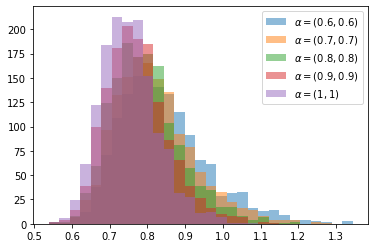

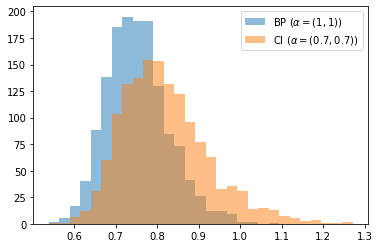

beliefs:


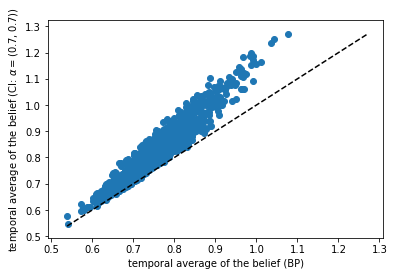

beliefs:


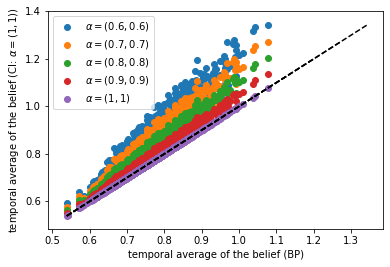

probabilities:


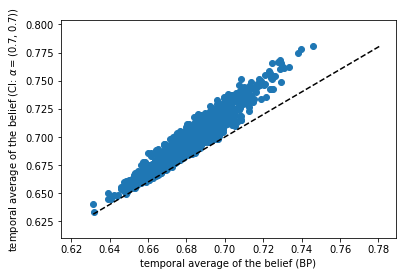

probabilities:


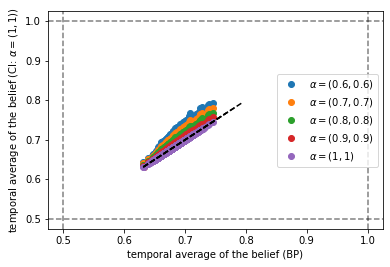

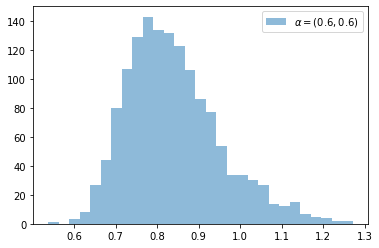

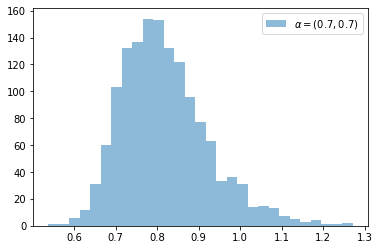

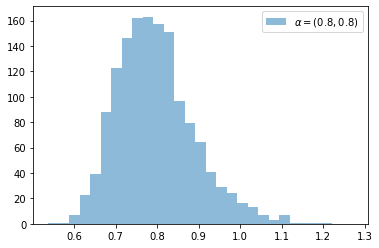

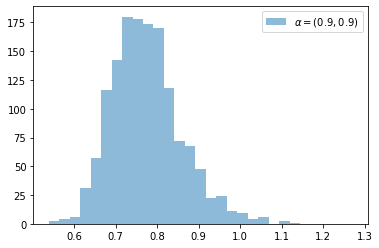

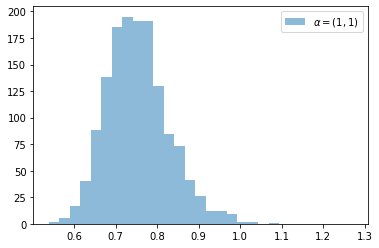

In [3]:
#temporal average of belief for BP vs CI (or of |belief|)

def sig(x):
    return 1 / (1+np.exp(-np.array(x)))

# mean_B_CI_all = {key: [{key1:np.mean(val1) for key1,val1 in el.items()} for el in val] for key,val in B_history_all.items()}  #beliefs
mean_B_CI_all = {key: [{key1: np.mean(np.abs(val1)) for key1,val1 in el.items()} for el in val] for key,val in B_history_all.items()} #beliefs in absolute value
mean_B_CI_all_flattened = {key: list(itertools.chain.from_iterable([list(d.values()) for d in val])) for key,val in mean_B_CI_all.items()}

vals = list(itertools.chain.from_iterable(mean_B_CI_all_flattened.values()))
bins = np.linspace(np.min(vals), np.max(vals), 30)
for alpha_CI in list_alphac_alphad:
    plt.hist(mean_B_CI_all_flattened[alpha_CI], bins=bins, label=r'$\alpha = {}$'.format(alpha_CI), alpha=0.5)
plt.legend()
plt.show()


alpha_CI = (0.7,0.7)
alpha_BP = (1,1)
vals = list(itertools.chain.from_iterable({key:val for key,val in mean_B_CI_all_flattened.items() if key in [alpha_CI, alpha_BP]}.values()))
bins = np.linspace(np.min(vals), np.max(vals), 30)
plt.hist(mean_B_CI_all_flattened[alpha_BP], bins=bins, label=r'BP ($\alpha = {}$)'.format(alpha_BP), alpha=0.5)
plt.hist(mean_B_CI_all_flattened[alpha_CI], bins=bins, label=r'CI ($\alpha = {}$)'.format(alpha_CI), alpha=0.5)
plt.legend()
plt.show()

#plot one vs the other
print("beliefs:")
alpha_CI = (0.7,0.7)
alpha_BP = (1,1)
x = mean_B_CI_all_flattened[alpha_BP]
y = mean_B_CI_all_flattened[alpha_CI]
plt.scatter(x, y)
x_lin = np.linspace(np.min([x,y]), np.max([x,y]), 2)
plt.plot(x_lin, x_lin, linestyle='--', color='black')
plt.xlabel('temporal average of the belief (BP)')
plt.ylabel(r'temporal average of the belief (CI: $\alpha = {}$)'.format(alpha_CI))
plt.show()


#plot one vs the other
print("beliefs:")
for alpha_CI in list_alphac_alphad:
    alpha_BP = (1,1)
    x = mean_B_CI_all_flattened[alpha_BP]
    y = mean_B_CI_all_flattened[alpha_CI]
    plt.scatter(x, y, label=r'$\alpha = {}$'.format(alpha_CI))
    x_lin = np.linspace(np.min([x,y]), np.max([x,y]), 2)
    plt.plot(x_lin, x_lin, linestyle='--', color='black')
plt.legend()
plt.xlabel('temporal average of the belief (BP)')
plt.ylabel(r'temporal average of the belief (CI: $\alpha = {}$)'.format(alpha_CI))
plt.show()


#plot one vs the other
print("probabilities:")
alpha_CI = (0.7,0.7)
alpha_BP = (1,1)
x = sig(mean_B_CI_all_flattened[alpha_BP])
y = sig(mean_B_CI_all_flattened[alpha_CI])
plt.scatter(x, y)
x_lin = np.linspace(np.min([x,y]), np.max([x,y]), 2)
plt.plot(x_lin, x_lin, linestyle='--', color='black')
plt.xlabel('temporal average of the belief (BP)')
plt.ylabel(r'temporal average of the belief (CI: $\alpha = {}$)'.format(alpha_CI))
plt.show()


#plot one vs the other
print("probabilities:")
for alpha_CI in list_alphac_alphad:
    alpha_BP = (1,1)
    x = sig(mean_B_CI_all_flattened[alpha_BP])
    y = sig(mean_B_CI_all_flattened[alpha_CI])
    plt.scatter(x, y, label=r'$\alpha = {}$'.format(alpha_CI))
    x_lin = np.linspace(np.min([x,y]), np.max([x,y]), 2)
    plt.plot(x_lin, x_lin, linestyle='--', color='black')
plt.legend()
plt.axhline(y=0.5,linestyle='--',color='black',alpha=0.5)
plt.axhline(y=1,linestyle='--',color='black',alpha=0.5)
plt.axvline(x=0.5,linestyle='--',color='black',alpha=0.5)
plt.axvline(x=1,linestyle='--',color='black',alpha=0.5)
plt.xlabel('temporal average of the belief (BP)')
plt.ylabel(r'temporal average of the belief (CI: $\alpha = {}$)'.format(alpha_CI))
plt.show()


for alpha_CI in list_alphac_alphad:
    plt.hist(mean_B_CI_all_flattened[alpha_CI], bins=bins, label=r'$\alpha = {}$'.format(alpha_CI), alpha=0.5)
    plt.legend()
    plt.show()



We don't get a sigmoidal shape for temporally averaged beliefs; I tried instead with the temporal average of the absolute value of the beliefs and it kind of works (but pb = not reaching the bounds p=0.5 and 1).

We should rather look at the instantaneous beliefs

node selected: Temporal_Mid_L


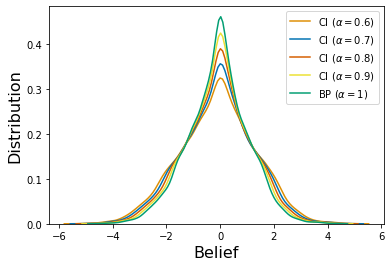

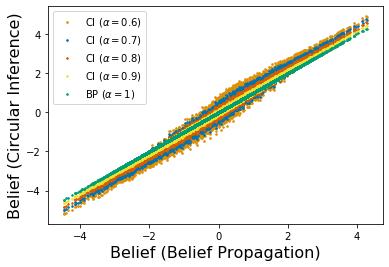

/home/vincent/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/vincent/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


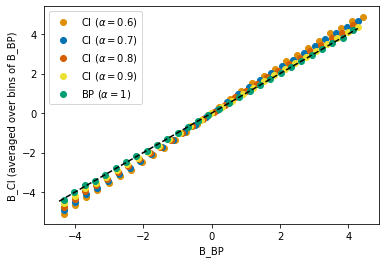

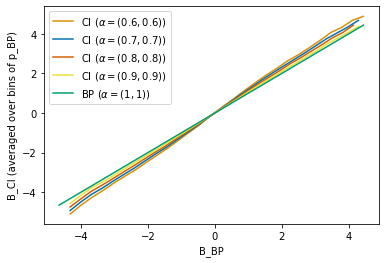

In [4]:
#looking instead at the instantaneous beliefs

from utils_dict import *
from colors_colorblind import colors_alphas

assert method_weighting == 'bimodal_w' #because we take all simulations, so they should have the exact same graph (here we ensure instead that the structure is the same, but the weighting of the graph might differ - but at least here we ensure that it doesn't differ too much as bimodal_w distribution are quite similar). Maybe instead take the same weighted graphs, or even look at only one simulation?

# {key:[[val1 for key1,val1 in el.items()] for el in val] for key,val in B_history_all.items()}
# node_selected = list(B_history_all[1,1][0].keys())[0]
node_selected = list(sort_dict_by_value(dict(list_G_all[0].degree())).keys())[0] #node with the highest degree #res.graph_G
print("node selected:", node_selected)
B_history_CI_all_node_0 = {key: np.array([el[node_selected] for el in val]).reshape(-1,) 
                           for key,val in B_history_all.items()} #only for node 0


for alpha_CI in list_alphac_alphad:
    y = B_history_CI_all_node_0[alpha_CI]
    prefix = 'CI' if alpha_CI != (1,1) else 'BP'
    assert alpha_CI[0] == alpha_CI[1] #ensures that alpha_c = alpha_d
    sns.distplot(y, hist = False, kde = True, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
plt.xlabel("Belief", size=16)
plt.ylabel("Distribution", size=16)
plt.legend()
plt.show()


for alpha_CI in list_alphac_alphad:
    x = B_history_CI_all_node_0[1,1]
    y = B_history_CI_all_node_0[alpha_CI]
    prefix = 'CI' if alpha_CI != (1,1) else 'BP'
    assert alpha_CI[0] == alpha_CI[1] #ensures that alpha_c = alpha_d
    plt.scatter(x, y, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI], s=2.5) #case alpha_c = alpha_d
plt.xlabel("Belief (Belief Propagation)", size=16)
plt.ylabel("Belief (Circular Inference)", size=16)
plt.legend()
plt.show()



for alpha_CI in list_alphac_alphad:
    x = B_history_CI_all_node_0[1,1]
    y = B_history_CI_all_node_0[alpha_CI]
    prefix = 'CI' if alpha_CI != (1,1) else 'BP'
#     plt.scatter(x, y, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI])
    x_bins = []
    y_bins = []
    bins_x = np.linspace(np.min(x)-0.01, np.max(y)+0.01, 30)
    for i in range(len(bins_x)-1):
        mean_y_bin = np.mean(y[(x>bins_x[i]) * (x<=bins_x[i+1])])
        mean_x_bin = np.mean([bins_x[i], bins_x[i+1]])
        x_bins.append([mean_x_bin])
        y_bins.append([mean_y_bin])
#     plt.scatter(x_bins, y_bins, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI])
    plt.scatter(x_bins, y_bins, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
x_lin = np.linspace(np.min([x,y]), np.max([x,y]), 2)
plt.plot(x_lin, x_lin, linestyle='--', color='black')
plt.xlabel('B_BP')
plt.ylabel('B_CI (averaged over bins of B_BP)')
plt.legend()
plt.show()



#beliefs
alpha_BP = (1,1)
for alpha_CI in list_alphac_alphad:
    if alpha_CI == alpha_BP:
        x_lin = np.linspace(np.min([x,y]), np.max([x,y]), 2)    
        # plt.plot(x_lin, x_lin, linestyle='--', color='black') #identity line
        plt.plot(x_lin, x_lin, label=r'BP ($\alpha = {}$)'.format((alpha_BP)), color=colors_alphas[alpha_BP]) #identity line (= BP)
        continue
    x = B_history_CI_all_node_0[alpha_BP]
    y = B_history_CI_all_node_0[alpha_CI]
    x_bins = []
    y_bins = []
    bins_x = np.linspace(np.min(x)-0.01, np.max(y)+0.01, 30)
    for i in range(len(bins_x)-1):
        mean_y_bin = np.mean(y[(x>bins_x[i]) * (x<=bins_x[i+1])])
        mean_x_bin = np.mean([bins_x[i], bins_x[i+1]])
        x_bins.append([mean_x_bin])
        y_bins.append([mean_y_bin])
#     plt.scatter(x_bins, y_bins, label='alpha = {}'.format(alpha_CI))
    plt.plot(x_bins, y_bins, label=r'CI ($\alpha = {}$)'.format(alpha_CI), color=colors_alphas[alpha_CI])
plt.xlabel('B_BP')
plt.ylabel('B_CI (averaged over bins of p_BP)')
plt.legend()
plt.show()

node selected: Temporal_Mid_L


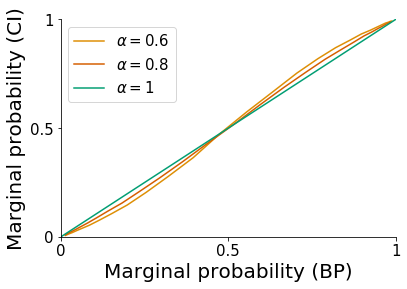

In [5]:
#Fig 3A+3B+3C+S4 - same but with probabilities instead of beliefs (=log-odds of the probability)

from utils_dict import *
from colors_colorblind import colors_alphas

def sig(x):
    return 1 / (1+np.exp(-np.array(x)))


# {key:[[val1 for key1,val1 in el.items()] for el in val] for key,val in B_history_all.items()}
# node_selected = list(B_history_all[1,1][0].keys())[0]
node_selected = list(sort_dict_by_value(dict(list_G_all[0].degree())).keys())[0] #node with the highest degree #res.graph_G
print("node selected:", node_selected)
B_history_CI_all_node_0 = {key:np.array([el[node_selected] for el in val]).reshape(-1,) for key,val in B_history_all.items()} #only for node 0


# for alpha_CI in list_alphac_alphad:
#     y = sig(B_history_CI_all_node_0[alpha_CI])
#     prefix = 'CI' if alpha_CI != (1,1) else 'BP'
# #     sns.distplot(y, hist = False, kde = True, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI])
#     sns.distplot(y, hist = False, kde = True, kde_kws={'clip': (0.0, 1.0)},
#                  label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
# plt.xlabel("Belief", size=16)
# plt.ylabel("Distribution", size=16)
# plt.xticks([0,0.5,1], [0,0.5,1])
# plt.yticks([])
# plt.legend()
# plt.xlim(0,1)
# # save_fig('Fig3B', type_graph)
# plt.show()


# for alpha_CI in list_alphac_alphad:
#     alpha_BP = (1,1)
#     x = sig(B_history_CI_all_node_0[alpha_BP])
#     y = sig(B_history_CI_all_node_0[alpha_CI])
#     prefix = 'CI' if alpha_CI != (1,1) else 'BP'
# #     plt.scatter(x, y, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI], s=2.5, alpha=0.6)
#     plt.scatter(x, y, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI], s=2.5, alpha=0.6) #only showing alpha_c (case where alpha_c = alpha_d)
# plt.xlabel('Belief (belief propagation)', size=14) #'probability (Belief Propagation)'
# plt.ylabel('Belief (circular inference)', size=14) #'probability (Circular Inference)'
# plt.xticks([0,0.5,1], [0,0.5,1])
# plt.yticks([0,0.5,1], [0,0.5,1])
# plt.xlim(0,1)
# plt.ylim(0,1)
# leg = plt.legend(markerscale=4.5)
# for lh in leg.legendHandles: 
#     lh.set_alpha(1) #remove the transparency in the legend
# # save_fig('Fig3C', type_graph)
# plt.show()


# for alpha_CI in list_alphac_alphad:
#     x = B_history_CI_all_node_0[1,1]
#     y = B_history_CI_all_node_0[alpha_CI]
#     prefix = 'CI' if alpha_CI != (1,1) else 'BP'
# #     plt.scatter(x, y, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI])
#     x_bins = []
#     y_bins = []
#     bins_x = np.linspace(np.min(x)-0.01, np.max(y)+0.01, 30)
#     for i in range(len(bins_x)-1):
#         mean_y_bin = np.mean(y[(x>bins_x[i]) * (x<=bins_x[i+1])])
#         mean_x_bin = np.mean([bins_x[i], bins_x[i+1]])
#         x_bins.append([mean_x_bin])
#         y_bins.append([mean_y_bin])
# #     plt.scatter(x_bins, y_bins, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI])
# #     plt.scatter(x_bins, y_bins, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
#     plt.scatter(sig(x_bins), sig(y_bins), label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
# plt.plot([0,1], [0,1], linestyle='--', color='black')
# plt.xlabel('p_BP')
# plt.ylabel('p_CI (averaged over bins of B_BP)')
# plt.xlim(0,1)
# plt.ylim(0,1)
# plt.legend()
# plt.show()

# # for alpha_CI in list_alphac_alphad:
# alpha_BP = (1,1)
# for alpha_CI in [(0.6,0.6), (0.8,0.8), (1,1)]: #selecting only [0.6,0.8,1]
#     if alpha_CI == alpha_BP:
# #         plt.plot([0,1], [0,1], label=r'BP ($\alpha = {}$)'.format(alpha_BP), color=colors_alphas[alpha_BP])  #identity line (= BP)
#         plt.plot([0,1], [0,1], label=r'BP ($\alpha = {}$)'.format(alpha_BP[0]), color=colors_alphas[alpha_BP])  #identity line (= BP) #case alpha_c = alpha_d
#         continue
#     x = B_history_CI_all_node_0[alpha_BP]
#     y = B_history_CI_all_node_0[alpha_CI]
#     # plt.scatter(x, y)
#     # plt.show()
#     x_bins = []
#     y_bins = []
#     bins_x = np.linspace(np.min(x)-0.01, np.max(y)+0.01, 30)
#     for i in range(len(bins_x)-1):
#         mean_y_bin = np.mean(y[(x>bins_x[i]) * (x<=bins_x[i+1])])
#         mean_x_bin = np.mean([bins_x[i], bins_x[i+1]])
#         x_bins.append([mean_x_bin])
#         y_bins.append([mean_y_bin])
# #     plt.scatter(sig(x_bins), sig(y_bins), label='alpha = {}'.format(alpha_CI))
# #     plt.plot(sig(x_bins), sig(y_bins), label=r'CI ($\alpha = {}$)'.format(alpha_CI), color=colors_alphas[alpha_CI])
#     plt.plot(sig(x_bins), sig(y_bins), label=r'CI ($\alpha = {}$)'.format(alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
# plt.xlabel('Belief (belief propagation)', size=16)
# plt.ylabel('Average belief (circular inference)', size=16) #plt.ylabel('p_CI (averaged over bins of p_BP)')
# plt.xticks([0,0.5,1], [0,0.5,1])
# plt.yticks([0,0.5,1], [0,0.5,1])
# plt.xlim(0,1)
# plt.ylim(0,1)
# plt.legend()
# # save_fig('Fig3A', type_graph)
# plt.show()


from utils_save_fig import *


#just for COSYNE
ax = plt.subplot(111)
alpha_BP = (1,1)
# for alpha_CI in list_alphac_alphad:
for alpha_CI in [(0.6,0.6), (0.8,0.8), (1,1)]: #selecting only [0.6,0.8,1]
    if alpha_CI == alpha_BP:
#         plt.plot([0,1], [0,1], label=r'BP ($\alpha = {}$)'.format(alpha_BP), color=colors_alphas[alpha_BP])  #identity line (= BP)
        plt.plot([0,1], [0,1], label=r'$\alpha = {}$'.format(alpha_BP[0]), color=colors_alphas[alpha_BP])  #identity line (= BP) #case alpha_c = alpha_d
        continue
    x = B_history_CI_all_node_0[alpha_BP]
    y = B_history_CI_all_node_0[alpha_CI]
    # plt.scatter(x, y)
    # plt.show()
    x_bins = []
    y_bins = []
    bins_x = np.linspace(np.min(x)-0.01, np.max(y)+0.01, 30)
    for i in range(len(bins_x)-1):
        mean_y_bin = np.mean(y[(x>bins_x[i]) * (x<=bins_x[i+1])])
        mean_x_bin = np.mean([bins_x[i], bins_x[i+1]])
        x_bins.append([mean_x_bin])
        y_bins.append([mean_y_bin])
#     plt.scatter(sig(x_bins), sig(y_bins), label='alpha = {}'.format(alpha_CI))
#     plt.plot(sig(x_bins), sig(y_bins), label=r'CI ($\alpha = {}$)'.format(alpha_CI), color=colors_alphas[alpha_CI])
    plt.plot(sig(x_bins), sig(y_bins), label=r'$\alpha = {}$'.format(alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
plt.xlabel('Marginal probability (BP)', size=20)
plt.ylabel('Marginal probability (CI)', size=20) #plt.ylabel('p_CI (averaged over bins of p_BP)')
plt.xticks([0,0.5,1], [0,0.5,1], size=15)
plt.yticks([0,0.5,1], [0,0.5,1], size=15)
plt.xlim(0,1)
plt.ylim(0,1)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.legend(prop={'size':15})
# save_fig('Fig3A_COSYNE2021', type_graph)
save_fig('Fig3A', type_graph)
plt.show()



# #distribution of p_CI for a given range of p_BP (for all alphas on the same figure)
# x_bins = [0.4, 0.6] #indecision
# for alpha_CI in list_alphac_alphad:
#     alpha_BP = (1,1)
#     x = sig(B_history_CI_all_node_0[alpha_BP])
#     y = sig(B_history_CI_all_node_0[alpha_CI])
# #     x_bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
#     for i in range(len(x_bins)-1):
#         y_bin = y[(x>x_bins[i]) * (x<=x_bins[i+1])]
#         x_bin = np.mean([x_bins[i], x_bins[i+1]])
# #         plt.hist(y_bin, label='p_BP in [{};{}]'.format(x_bins[i], x_bins[i+1]))
# #         sns.distplot(y_bin, hist = False, kde = True, label=r'$\alpha = {}$'.format(alpha_CI)) #label='p_BP in [{};{}]'.format(x_bins[i], x_bins[i+1]))
#         prefix = 'CI' if alpha_CI != (1,1) else 'BP'
# #         sns.distplot(y_bin, hist = False, kde = True, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI]) #label='p_BP in [{};{}]'.format(x_bins[i], x_bins[i+1]))
#         sns.distplot(y_bin, hist = False, kde = True, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
# #     plt.scatter(x, y, label='alpha = {}'.format(alpha_CI))
# plt.legend()
# plt.xlabel('Belief', size=16)
# # plt.ylabel(r'Distribution (with restriction p_BP $\in$ [0.4;0.6])') #plt.ylabel('Distribution of p_CI for p_BP in [0.4;0.6]')
# plt.ylabel(r'Distribution (with restriction $p_{BP} \in [0.4; 0.6]$)') #plt.ylabel('Distribution of p_CI for p_BP in [0.4;0.6]')
# plt.xticks([0,0.2, 0.4,0.5,0.6, 0.8, 1], [0,0.2, 0.4,0.5,0.6, 0.8, 1])
# plt.yticks([])
# # save_fig('FigS4', type_graph)
# plt.show()

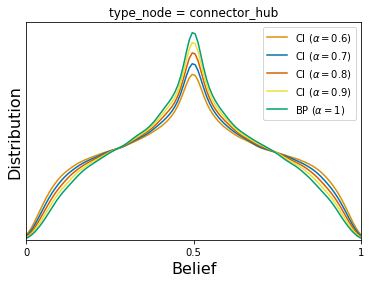

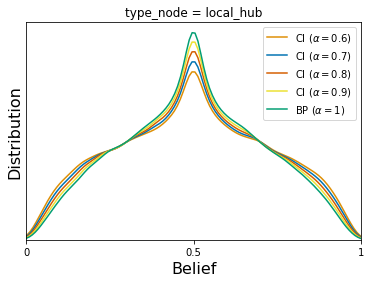

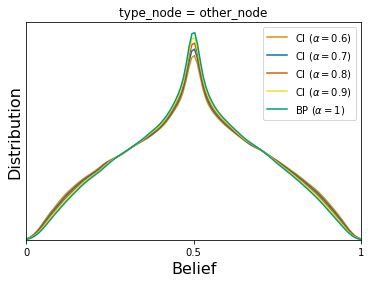

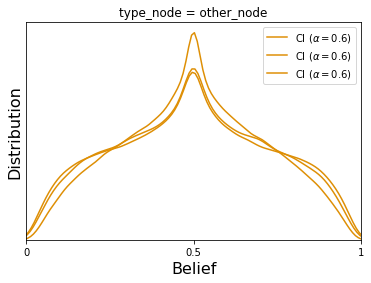

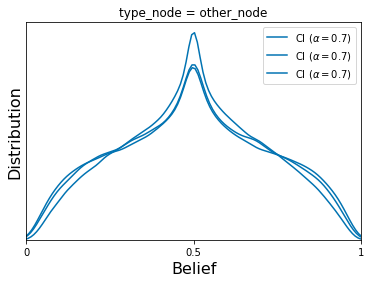

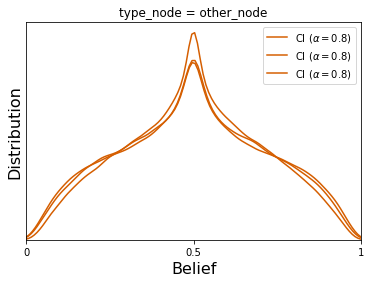

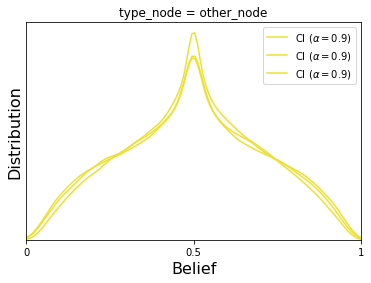

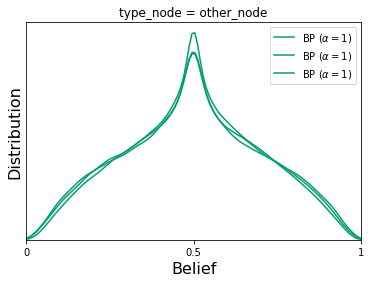

In [6]:
#Fig 3B

from utils_find_hubs import type_hub
d_type_node = {node: type_hub(list_G_all[0], node) for node in list_G_all[0].nodes} #res.graph_G
d_type_node = {type_node: list(np.array(list(d_type_node.keys()))[np.array(list(d_type_node.values())) == type_node])
               for type_node in np.unique(list(d_type_node.values()))
              }
B_history_CI_all_nodes = {key:{node:np.array([el[node] for el in val]).reshape(-1,)
                               for node in list_G_all[0].nodes} #res.graph_G
                          for key,val in B_history_all.items()}

for type_node, list_type_node in d_type_node.items():
    
    B_history_CI_all_type_node = {key: {node:val[node] for node in list_type_node}
                                  for key, val in B_history_CI_all_nodes.items()}
    
    for alpha_CI in list_alphac_alphad:
#         print(np.array(list(B_history_CI_all_type_node[alpha_CI].values())).flatten().shape)
        
        y = sig(np.array(list(B_history_CI_all_type_node[alpha_CI].values())).flatten())
        prefix = 'CI' if alpha_CI != (1,1) else 'BP'
    #     sns.distplot(y, hist = False, kde = True, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI])
        sns.distplot(y, hist = False, kde = True, kde_kws={'clip': (0.0, 1.0)},
                     label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
    plt.xlabel("Belief", size=16)
    plt.ylabel("Distribution", size=16)
    plt.xticks([0,0.5,1], [0,0.5,1])
    plt.yticks([])
    plt.legend()
    plt.xlim(0,1)
    plt.title('type_node = {}'.format(type_node))
    # save_fig('Fig3B_type_nodes', type_graph)
    plt.show()
    
#     for node in list_type_node:
#         B_history_CI_all_type_node = {key: val[node] for key, val in B_history_CI_all_nodes.items()}
        
    
for alpha_CI in list_alphac_alphad:
    for type_node, list_type_node in d_type_node.items():

        B_history_CI_all_type_node = {key: {node:val[node] for node in list_type_node}
                                      for key, val in B_history_CI_all_nodes.items()}

    #         print(np.array(list(B_history_CI_all_type_node[alpha_CI].values())).flatten().shape)

        y = sig(np.array(list(B_history_CI_all_type_node[alpha_CI].values())).flatten())
        prefix = 'CI' if alpha_CI != (1,1) else 'BP'
    #     sns.distplot(y, hist = False, kde = True, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI])
        sns.distplot(y, hist = False, kde = True, kde_kws={'clip': (0.0, 1.0)},
                     label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
    plt.xlabel("Belief", size=16)
    plt.ylabel("Distribution", size=16)
    plt.xticks([0,0.5,1], [0,0.5,1])
    plt.yticks([])
    plt.legend()
    plt.xlim(0,1)
    plt.title('type_node = {}'.format(type_node))
    # save_fig('Fig3B_type_nodes', type_graph)
    plt.show()
    
    
#Conclusion: there is no difference in the distribution of beliefs between connector hubs, local hubs and other nodes (even though I showed a difference in the distribution of overconfidence: see figure 4B)

node selected: Temporal_Mid_L


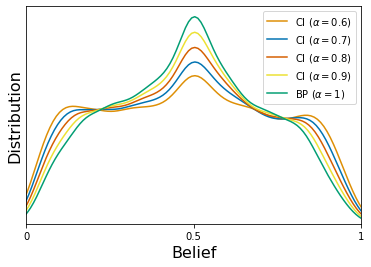

In [7]:
#show Fig3b (distribution of beliefs) for different types of nodes

# {key:[[val1 for key1,val1 in el.items()] for el in val] for key,val in B_history_all.items()}
# node_selected = list(B_history_all[1,1][0].keys())[0]
node_selected = list(sort_dict_by_value(dict(list_G_all[0].degree())).keys())[0] #node with the highest degree #res.graph_G
print("node selected:", node_selected)
B_history_CI_all_node_0 = {key:np.array([el[node_selected] for el in val]).reshape(-1,) 
                           for key,val in B_history_all.items()} #only for one node


for alpha_CI in list_alphac_alphad:
    y = sig(B_history_CI_all_node_0[alpha_CI])
    prefix = 'CI' if alpha_CI != (1,1) else 'BP'
#     sns.distplot(y, hist = False, kde = True, label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI), color=colors_alphas[alpha_CI])
    sns.distplot(y, hist = False, kde = True, kde_kws={'clip': (0.0, 1.0)},
                 label=r'{} ($\alpha = {}$)'.format(prefix, alpha_CI[0]), color=colors_alphas[alpha_CI]) #case alpha_c = alpha_d
plt.xlabel("Belief", size=16)
plt.ylabel("Distribution", size=16)
plt.xticks([0,0.5,1], [0,0.5,1])
plt.yticks([])
plt.legend()
plt.xlim(0,1)
# save_fig('Fig3B_type_nodes', type_graph)
plt.show()


node selected: Temporal_Mid_L


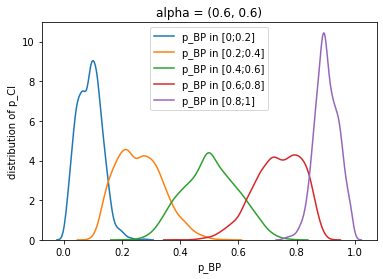

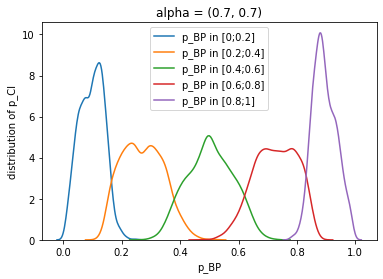

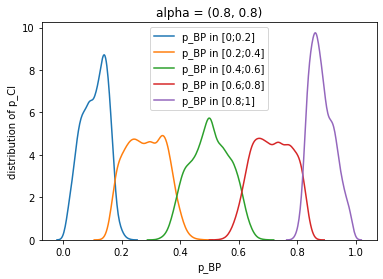

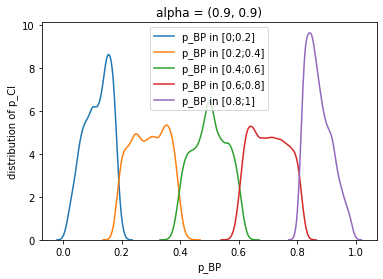

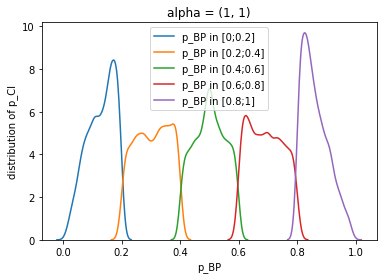

In [8]:
# node_selected = list(B_history_all[1,1][0].keys())[0]
node_selected = list(sort_dict_by_value(dict(list_G_all[0].degree())).keys())[0] #node with the highest degree #res.graph_G
print("node selected:", node_selected)
B_history_CI_all_node_0 = {key:np.array([el[node_selected] for el in val]).reshape(-1,) for key,val in B_history_all.items()} #only for node 0

#distribution of p_CI for a given range of p_BP (+ covering the whole range of p_BP)
for alpha_CI in list_alphac_alphad:
    alpha_BP = (1,1)
    x = sig(B_history_CI_all_node_0[alpha_BP])
    y = sig(B_history_CI_all_node_0[alpha_CI])
    x_bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
    for i in range(len(x_bins)-1):
        y_bin = y[(x>x_bins[i]) * (x<=x_bins[i+1])]
        x_bin = np.mean([x_bins[i], x_bins[i+1]])
#         plt.hist(y_bin, label='p_BP in [{};{}]'.format(x_bins[i], x_bins[i+1]))
        sns.distplot(y_bin, hist = False, kde = True, label='p_BP in [{};{}]'.format(x_bins[i], x_bins[i+1]))
#     plt.scatter(x, y, label='alpha = {}'.format(alpha_CI))
    plt.legend()
    plt.xlabel('p_BP')
    plt.ylabel('distribution of p_CI')
    plt.title('alpha = {}'.format(alpha_CI))
    plt.show()

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

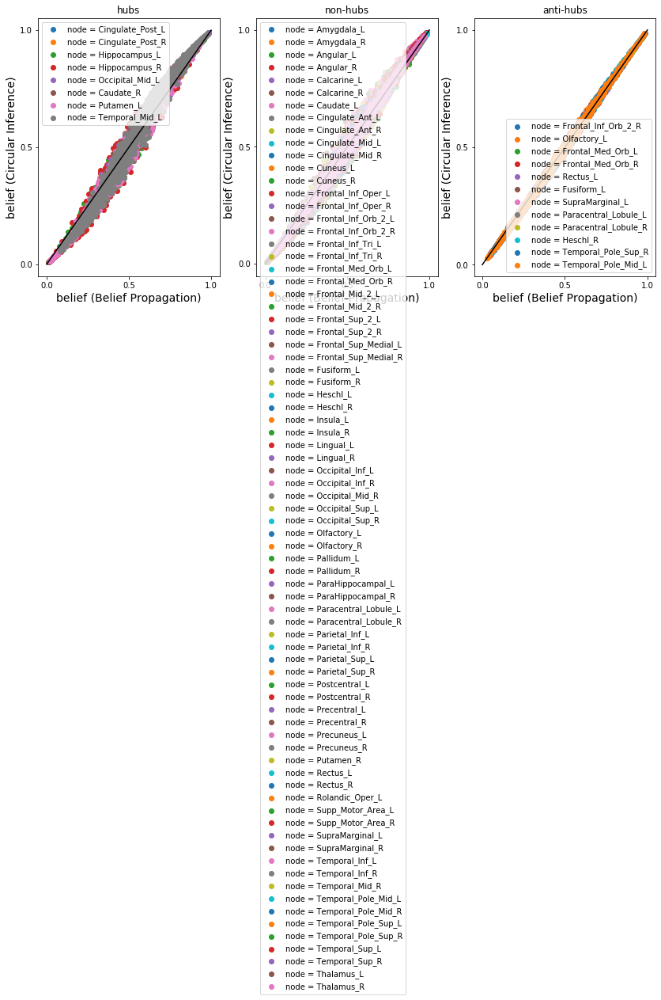

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

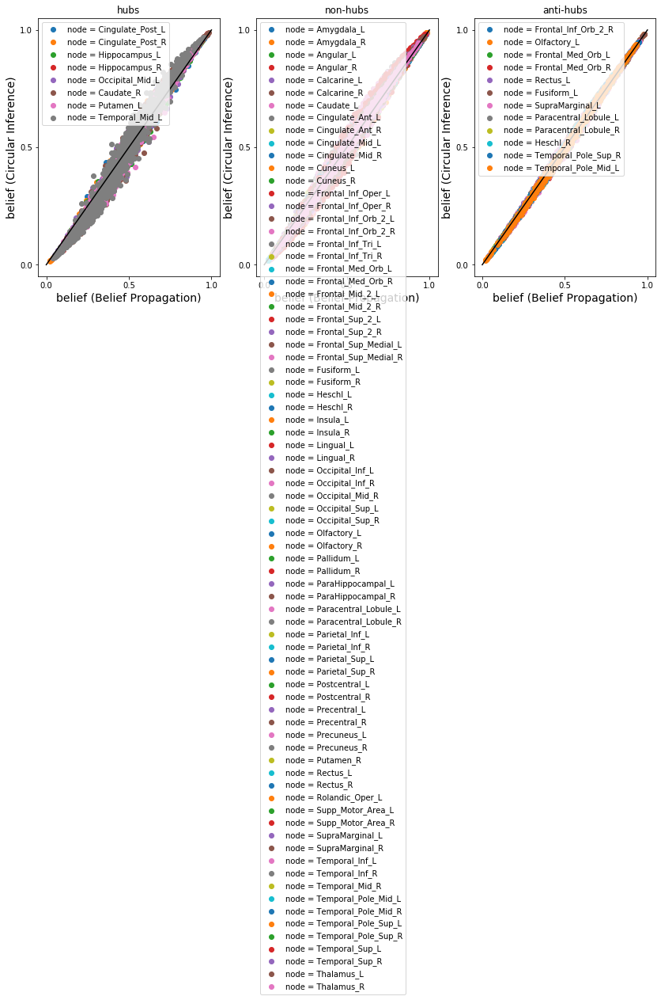

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

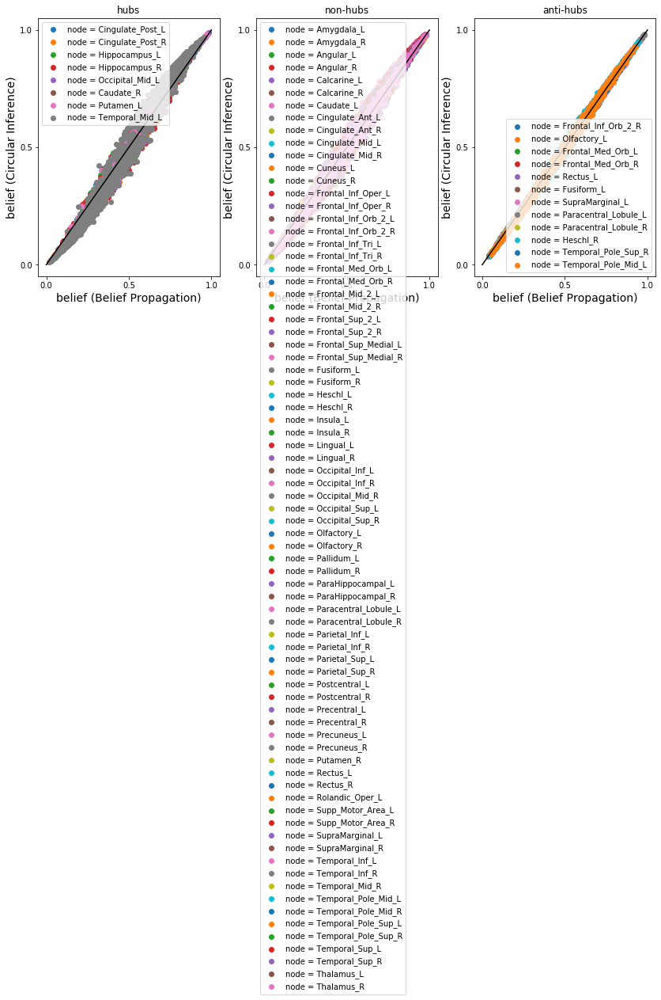

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

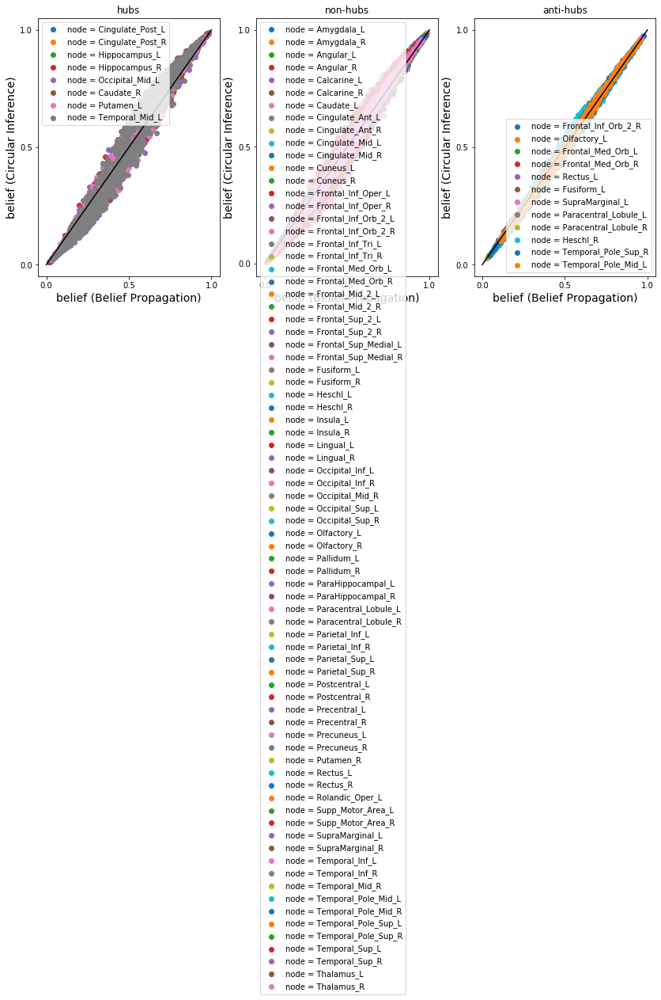

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

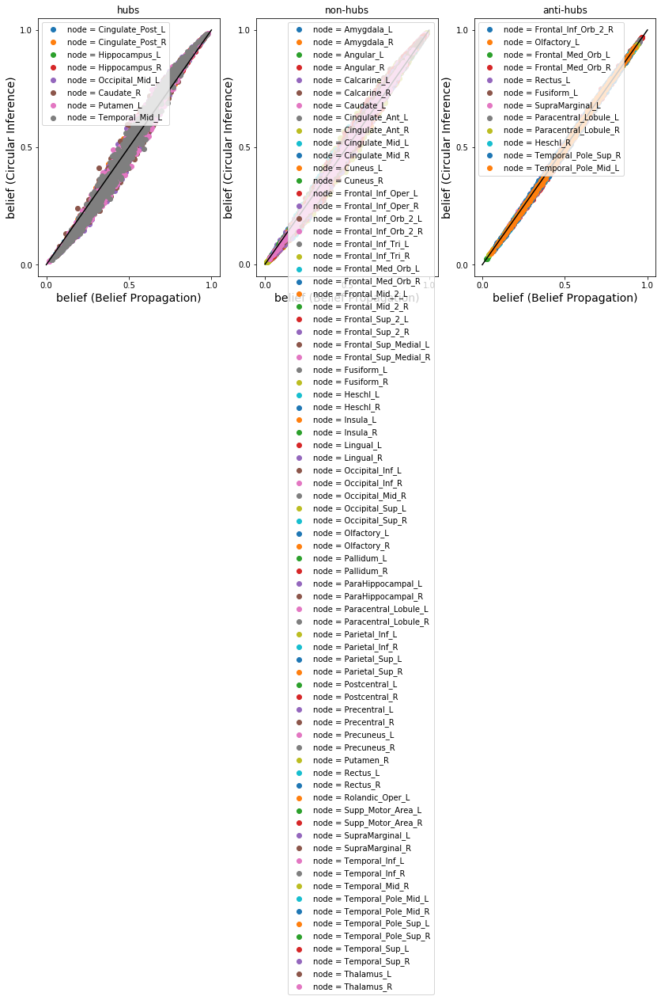

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

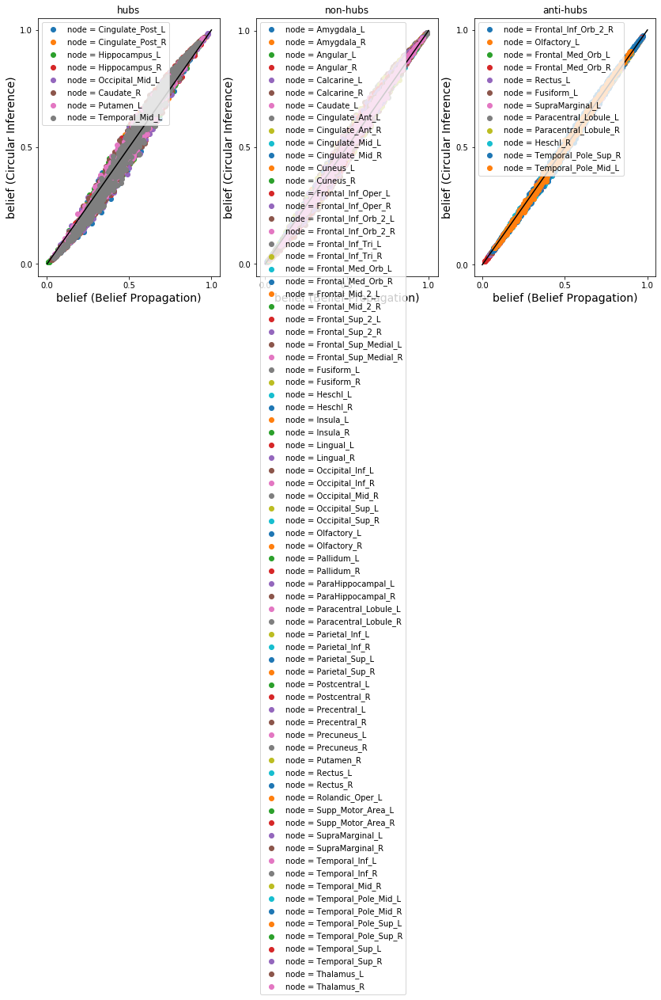

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

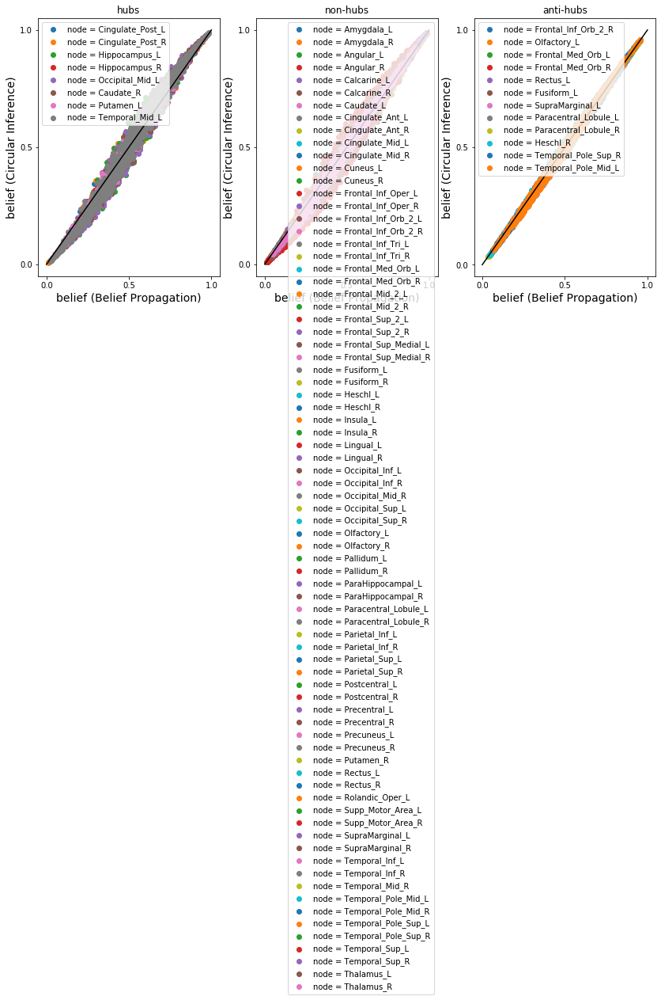

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

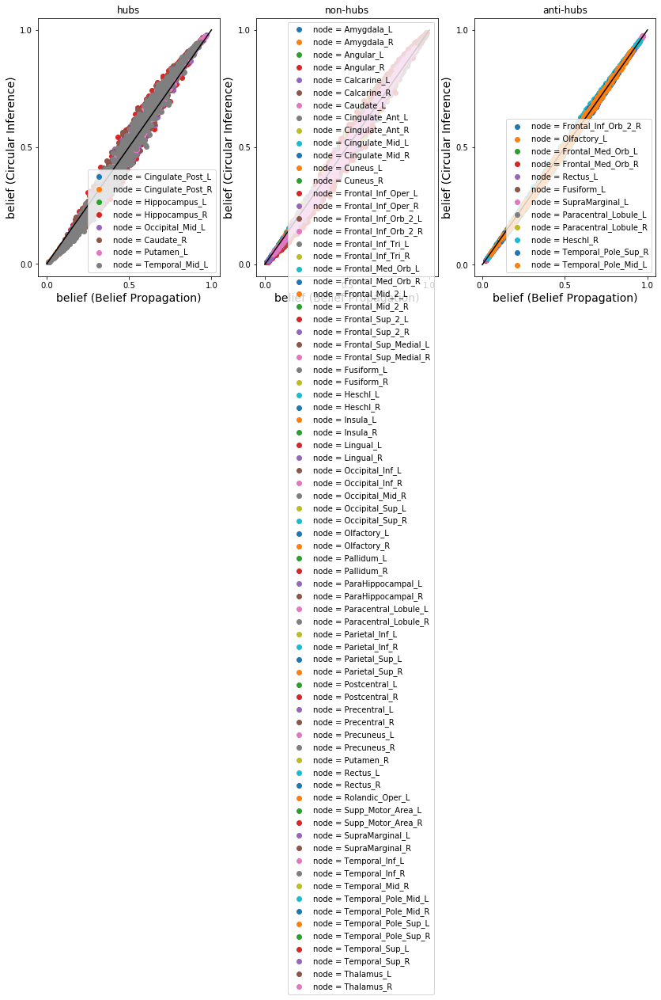

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

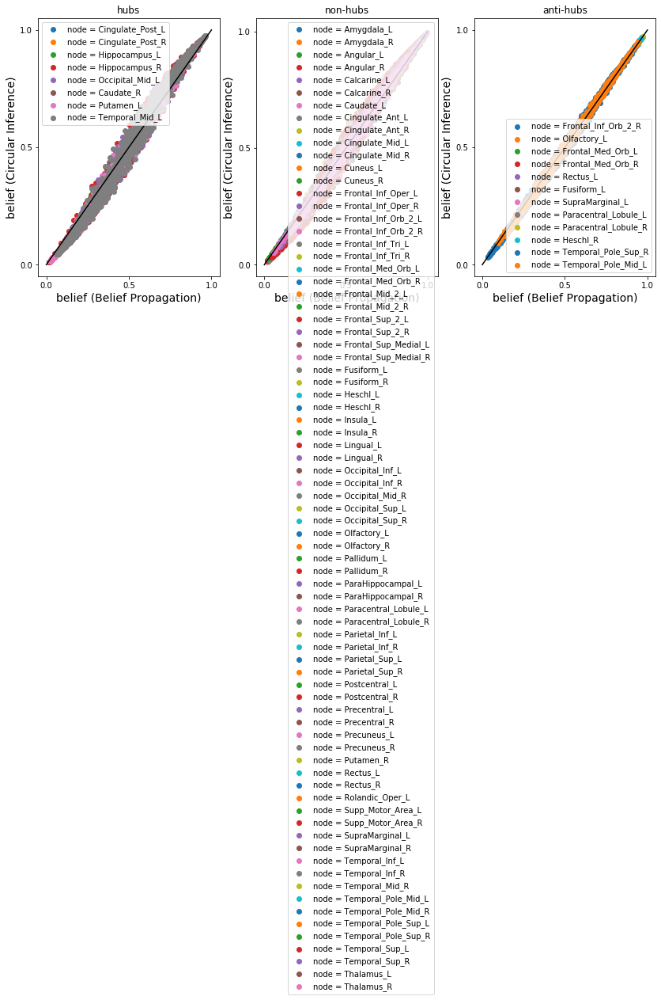

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

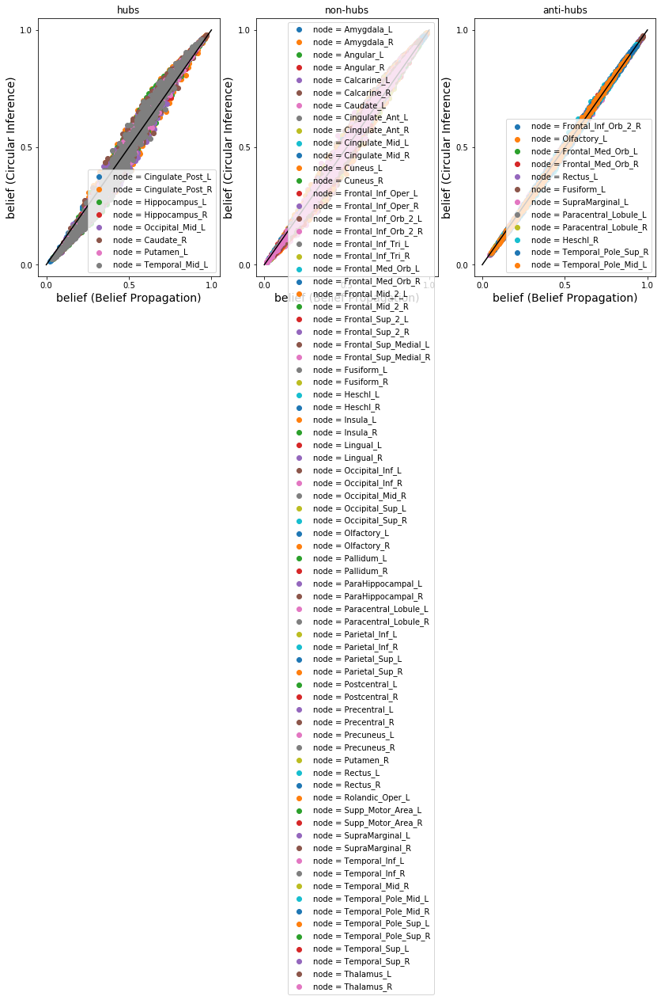

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

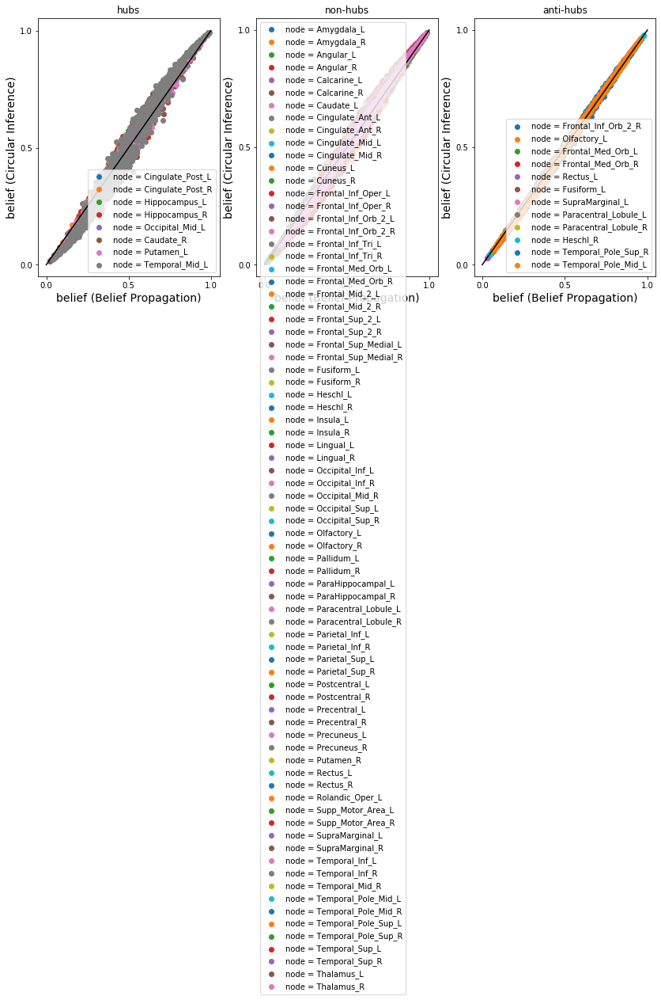

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

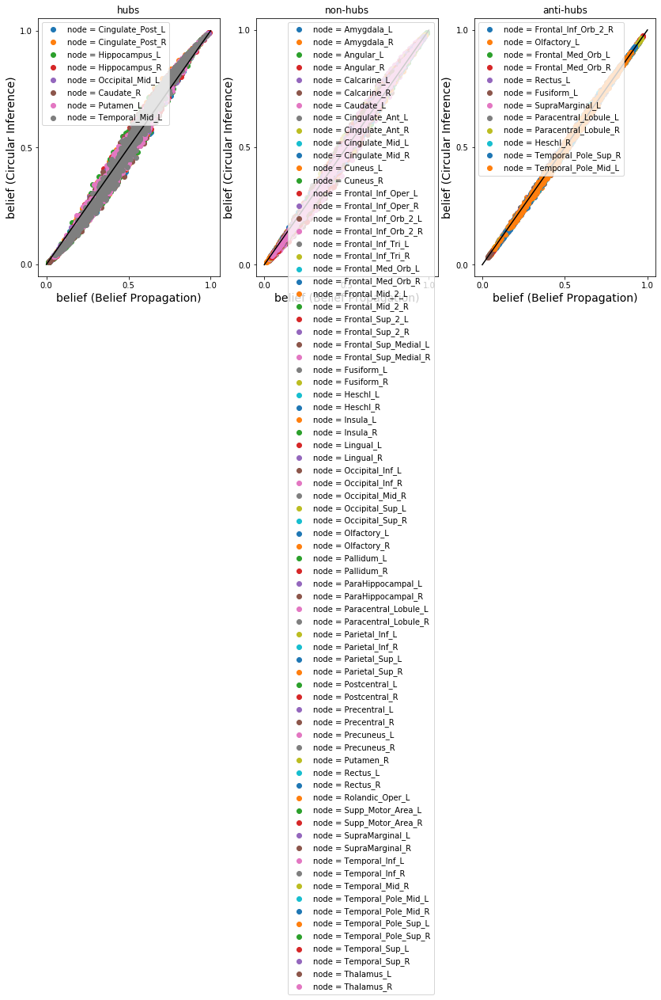

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

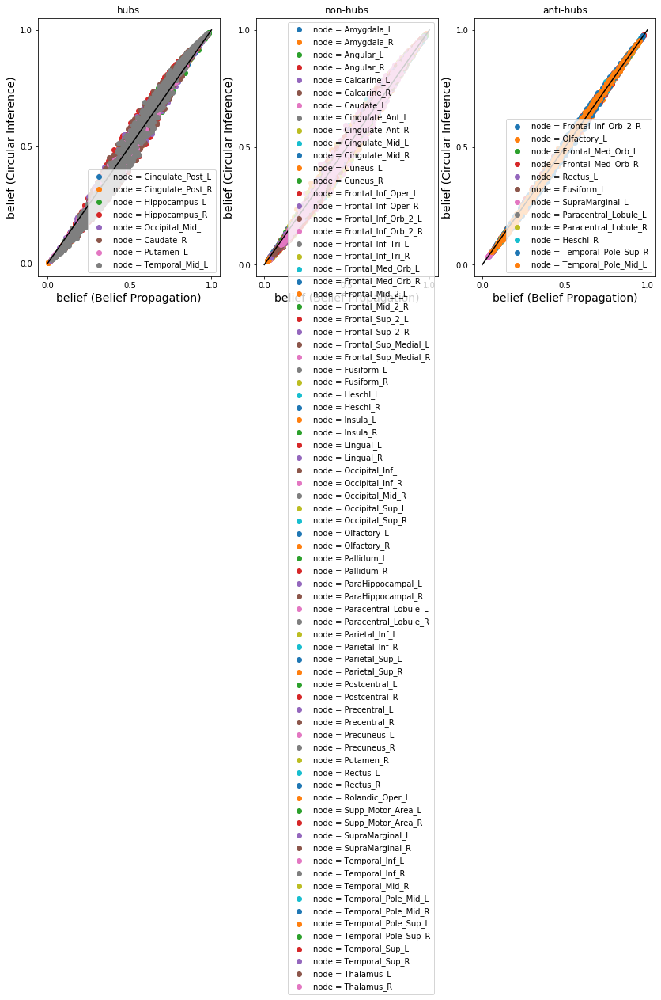

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

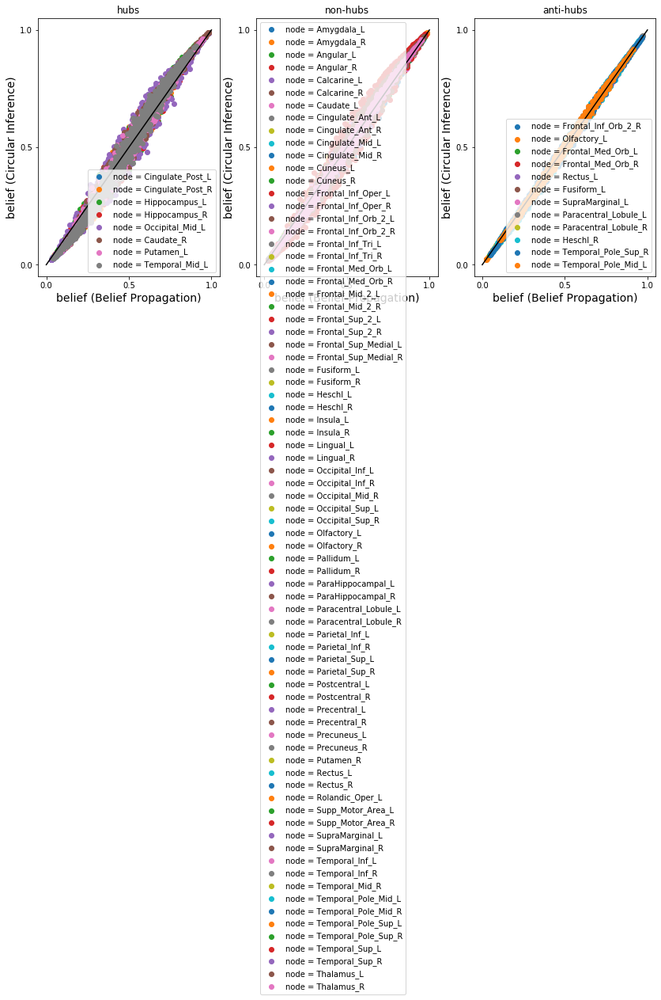

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

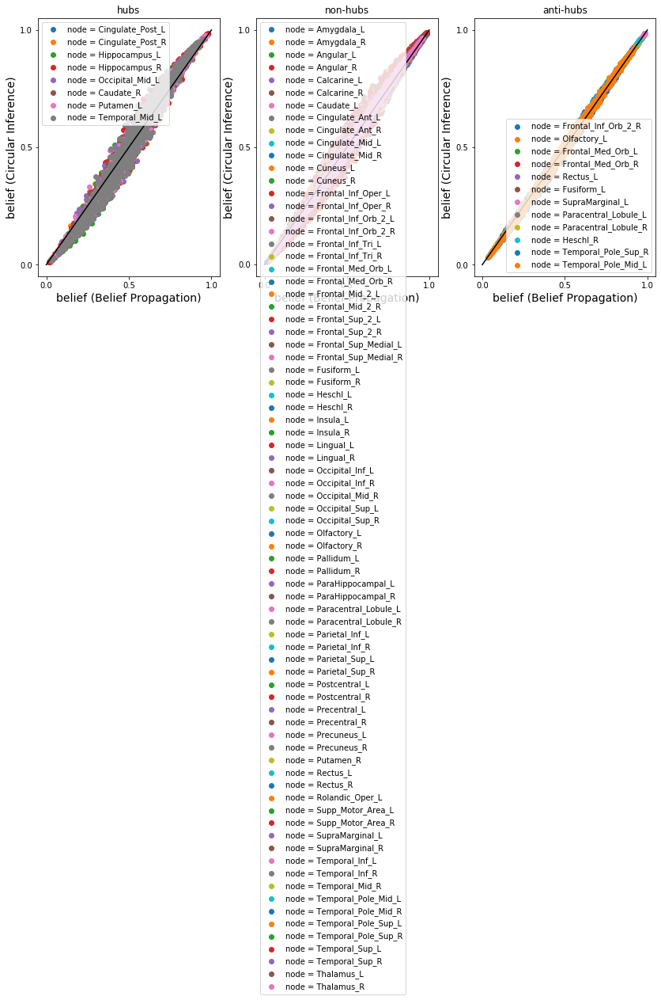

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

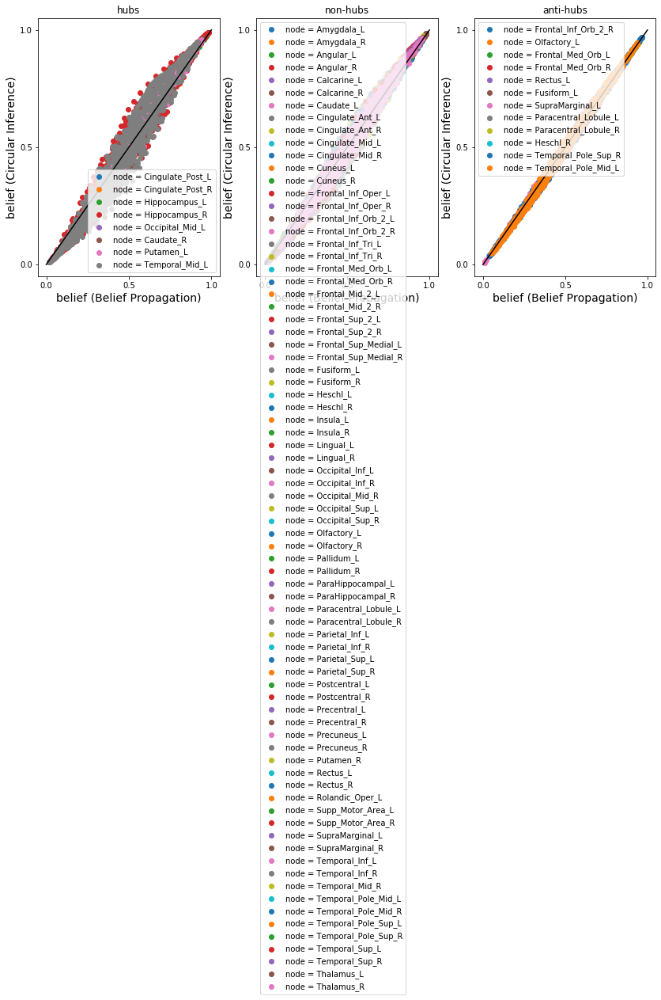

hubs: ['Cingulate_Post_L', 'Cingulate_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'Occipital_Mid_L', 'Caudate_R', 'Putamen_L', 'Temporal_Mid_L']
not_hubs: ['Amygdala_L', 'Amygdala_R', 'Angular_L', 'Angular_R', 'Calcarine_L', 'Calcarine_R', 'Caudate_L', 'Cingulate_Ant_L', 'Cingulate_Ant_R', 'Cingulate_Mid_L', 'Cingulate_Mid_R', 'Cuneus_L', 'Cuneus_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Fusiform_L', 'Fusiform_R', 'Heschl_L', 'Heschl_R', 'Insula_L', 'Insula_R', 'Lingual_L', 'Lingual_R', 'Occipital_Inf_L', 'Occipital_Inf_R', 'Occipital_Mid_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Olfactory_L', 'Olfactory_R', 'Pallidum_L', 'Pallidum_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Paracentral_Lobule_L', 'Paracentral_Lobule_R', 'Pari

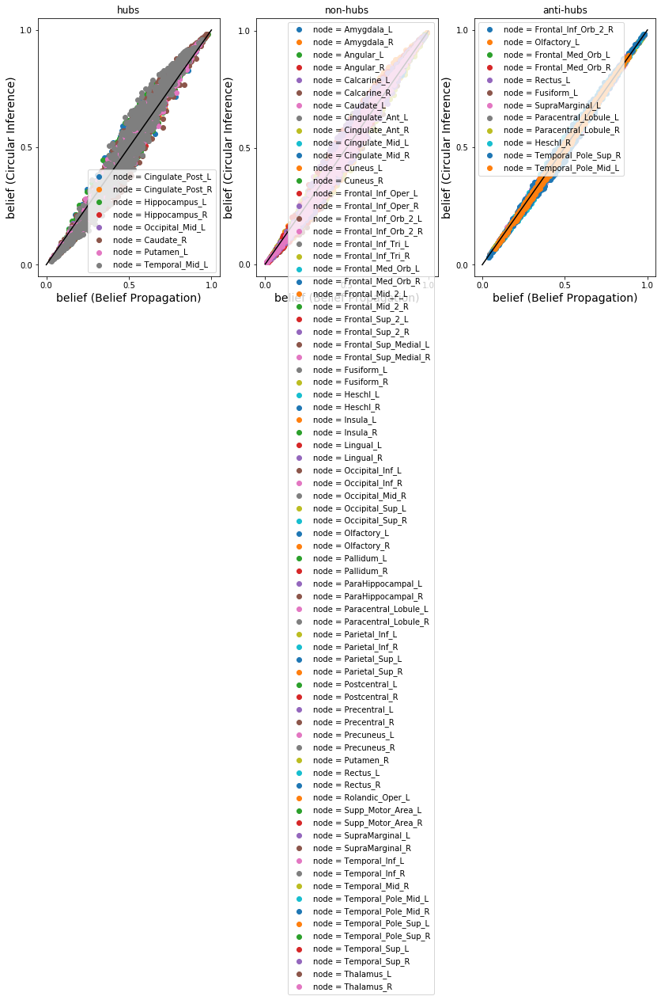

In [9]:
#detect hubs vs non-hubs

from utils_find_hubs import *

alpha_CI = (0.7,0.7)
alpha_BP = (1,1)
for i, G in enumerate(list_G_all):
    hubs = find_hubs(G)
    print("hubs:", hubs)
    not_hubs = sorted(set(list(G.nodes)) - set(hubs))
    print("not_hubs:", not_hubs)
    antihubs = find_antihubs(G)
    print("antihubs:", antihubs)
    
    fig = plt.figure(figsize=(14,6))
    iterate_on = [
        ["hubs", hubs],
        ["non-hubs", not_hubs],
        ["anti-hubs", antihubs]
    ]
    for j,[type_node,list_nodes] in enumerate(iterate_on):
        plt.subplot(1, len(iterate_on), j+1)
        dict_B_history_CI_hubs = {key:val for key,val in B_history_all[alpha_CI][i].items() if key in list_nodes}
        dict_B_history_BP_hubs = {key:val for key,val in B_history_all[alpha_BP][i].items() if key in list_nodes}
    
        #probabilities
        for node in list_nodes:
            x = sig(dict_B_history_BP_hubs[node])
            y = sig(dict_B_history_CI_hubs[node])
            plt.scatter(x, y, label="node = {}".format(node))
#         plt.legend()
        plt.xlabel('belief (Belief Propagation)', size=14)
        plt.ylabel('belief (Circular Inference)', size=14)
        plt.xticks([0,0.5,1])
        plt.yticks([0,0.5,1])
        plt.title(type_node)
        plt.legend()
        plt.plot([0,1],[0,1], color='black')
    plt.show()
    
# TODO: look at connector hubs, local hubs, ...etc

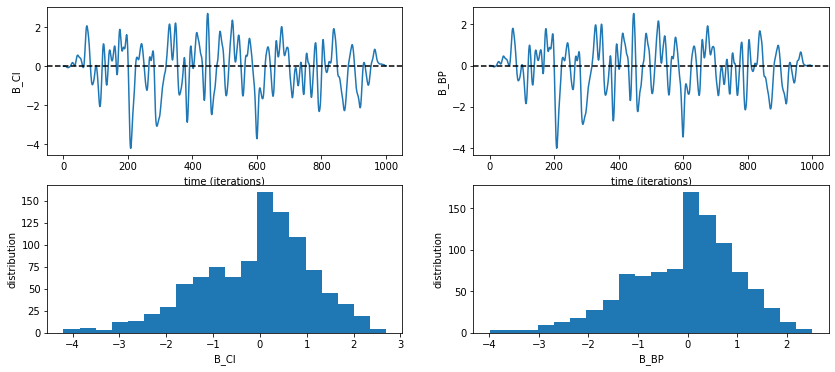

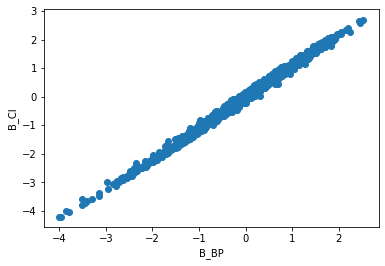

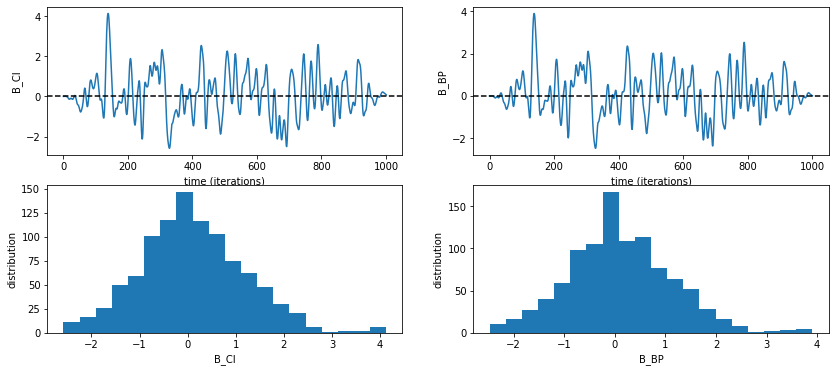

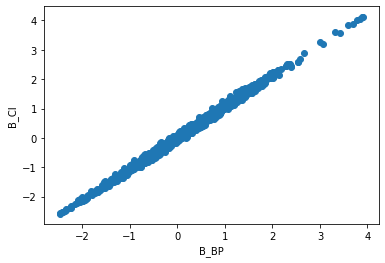

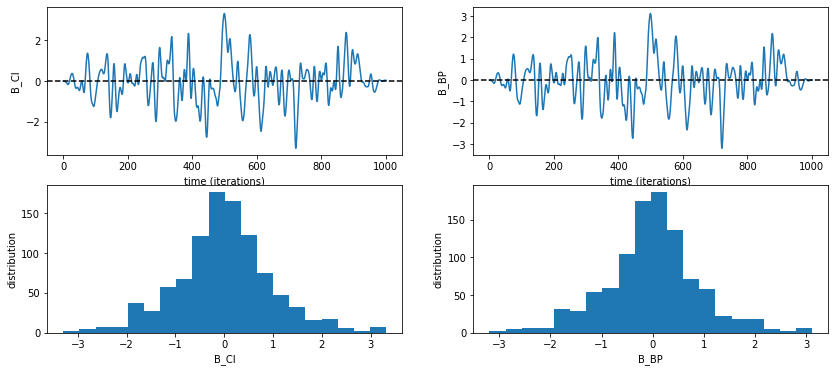

...

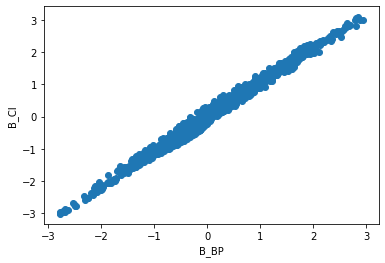

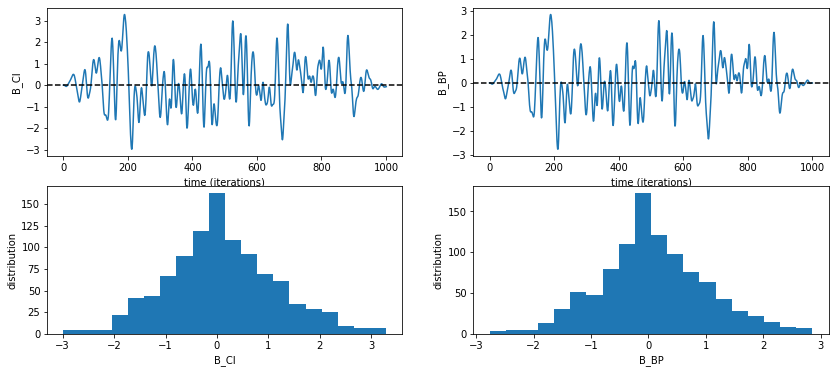

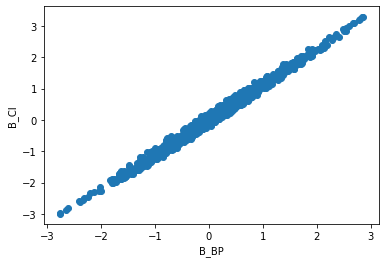

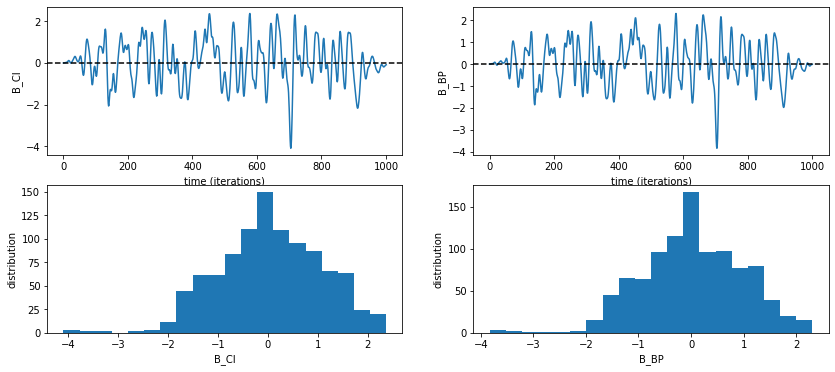

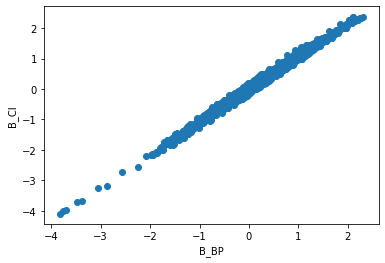

In [10]:
alpha_CI = (0.7,0.7)
alpha_BP = (1,1)

i = -2

d_CI = B_history_all[alpha_CI][i]
d_BP = B_history_all[alpha_BP][i]

for node in d_CI.keys():
    
    val_CI = d_CI[node]
    val_BP = d_BP[node]
    
    plt.figure(figsize=(14,6))
    
    plt.subplot(2,2,1)
    plt.plot(val_CI)
    plt.axhline(y=0, linestyle='--', color='black')
    plt.xlabel('time (iterations)')
    plt.ylabel('B_CI')
    plt.subplot(2,2,3)
    plt.hist(val_CI,bins=20)
    plt.xlabel('B_CI')
    plt.ylabel('distribution')
    
    plt.subplot(2,2,2)
    plt.plot(val_BP)
    plt.xlabel('time (iterations)')
    plt.ylabel('B_BP')
    plt.axhline(y=0, linestyle='--', color='black')
    plt.subplot(2,2,4)
    plt.hist(val_BP,bins=20)
    plt.xlabel('B_BP')
    plt.ylabel('distribution')
#     plt.yticks([])
    
    plt.show()
    
    plt.scatter(val_BP, val_CI)
    plt.xlabel('B_BP')
    plt.ylabel('B_CI')
    plt.show()

In [11]:
#detect bistability (for the lowest value of alpha_CI only: if there is bistability for higher values of alpha_CI or even for alpha_BP, then there is most probably for the lowest alpha_CI as well)

from utils_CI_BP import detect_bistability_dict

    
alpha_CI = (0.6, 0.6)

for i in range(len(list_G_all)):
    d_CI = B_history_all[alpha_CI][i]
    c = detect_bistability_dict(d_CI)
    print(c)
#     d = {key:np.histogram(val,bins=np.linspace(-10,10,31)) for key,val in d_CI.items()}
#     print(d)


False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
